## Methods and Plan, Computational Code and Output (individual assignment 2)

##### *Luna Gulec - 84272830 - STAT 301 101 Group 31*

***
***

### Part 1 - Planning stage: Data Description, Exploratory Data Analysis, Visualization:

***
***

### 1. Data Description

##### Provide a full description of the dataset chosen. Note that the selected dataset will probably contain more variables than you need. In fact, exploring how the different variables in the dataset affect your model may be a crucial part of the project. Regardless of which variables you plan to use, provide a full descriptive summary of the dataset, including information such as the number of observations, number of variables, name and type of variables, etc. You may want to use a table or bullet points to describe the variables in the dataset.

##### Include a brief description of the dataset indicating how the data has been collected or where it comes from.

> 

**Dataset summary**
- Dataset source: https://www.kaggle.com/datasets/whenamancodes/predict-diabities/data
- Data source: National Institute of Diabetes and Digestive and Kidney Diseases
- Objective: To predict whether a patient has diabetes based on diagnostic health measurements
- Population Constraints: All patients are females who are at least 21 years old and of Pima Indian heritage
    - Data collected from a larger database under specific constraints, focusing on diagnostic measures that contribute to diabetes prediction.

**Dataset characteristics**
- Total observations/rows: 768
- Total variables/columns: 9
    - Independent Variables: 8 medical predictor vaiables
    - Dependent variable: 1 target variable, Outcome, which indicates the presence (1) or absence (0) of diabetes

**Variable description and type**
| Column                   | Description                                 | Type |
|--------------------------|---------------------------------------------|---------------------------------|
| Pregnancies              | To express the Number of pregnancies        | Integer |
| Glucose                  | To express the Glucose level in blood       | Integer |
| BloodPressure            | To express the Blood pressure measurement   | Integer |
| SkinThickness            | To express the thickness of the skin        | Integer |
| Insulin                  | To express the Insulin level in blood       | Integer |
| BMI                      | To express the Body mass index              | Float |
| DiabetesPedigreeFunction | To express the Diabetes percentage          | Float |
| Age                      | To express the age                          | Integer |
| Outcome                  | To express the final result (1 is Yes, 0 is No) | Integer |
- _Note: while Outcome is an integer here, we will need to change it for logistic regression, as it will be the binary response. I will be referencing logistic regression throughout when cleaning and exploring the dataset as I believe it's impportant and relevant, but I will not create a model here._

***
***

### 2. Question

##### Clearly state the question you will try to answer using the selected dataset. Your question should involve one random variable of interest (the response) and one or more explanatory variables. Describe clearly how the data will help you address the question of interest. Explain whether your question is focused on prediction, inference, or both.

##### It is fine to have the same question as other group members. However, you don’t need to agree on a unique common question for the group project. In fact, usually many questions can be answered with the same dataset. Regardless of how many questions are proposed within each group, each team member must state and justify at least one question of interest.

>  

**Question of interest**

Which variables best predict diabetes, and to what extent do health metrics predict the likelihood of a diabetes diagnosis?

**Explanation of the approach**

- Our goal is to develop a model that predicts the likelihood of diabetes based on various health metrics in the dataset.
- We will be using **logistic regression**, given the binary dependent variable Outcome (1 for diabetes, 0 for no diabetes). 
- By exploring the relationships between predictors and possible multicollinearity as I will be doing here, we can identify key predictor variables that may influence the likelihood of diabetes and to include in our model, and investigate the significance of each predictor variable to infer which factors are most strongly associated with diabetes.

**How the data will help**

- With Outcome indicating the presence (1) or absence (0) of diabetes, it is a suitable binary variable which can be used for logistic regression.
- The dataset provides essential diagnostic measurements as predictor variables, which are relevant to diabetes. These health metrics will allow for exploration of how different health metrics affect diabetes and how each metric changes with diabetes or other metrics, as well as an assessment of each variable’s predictive power and the creation of a model that can potentially predict diabetes based on the health metrics.
- There are 8 predictors in the dataset, which gives us a variety of metrics to explore in relation to Outcome. We can explore the relationships on each other (i.e. possible multicollinearity), but for the model later on, I think the relevant predictors to choose from our question of interest are Glucose, BloodPressure, Insulin, and BMI. 

***
***

### 3. Exploratory Data Analysis

##### In this assignment, you will:
- ##### Demonstrate that the dataset can be loaded into R.
- ##### Clean and wrangle your data into a tidy format.
- ##### Propose a visualization that you consider relevant to address your question or to explore the data.
    - ##### propose a high-quality plot or set of plots of the same kind (e.g., histograms of different variables)
    - ##### explain why you consider this plot relevant to address your question or to explore the data


##### Note: this visualization does not have to illustrate the results of a methodology. Instead, you are exploring which variables are relevant, potential problems that you anticipate encountering, groups in the observations, etc.

In [1]:
# load necessary packages
library(tidyverse)
library(dplyr)
library(ggplot2)
library(gridExtra)
library(reshape2)
library(corrplot)
library(car)
library(GGally)
library(pROC)
library(leaps)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine



Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths


corrplot 0.92 loaded

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    some


Registered S3 method overwritten by 'GGally':
  method fr

***

**1. LOADING THE DATA INTO R**

The dataset is a CSV file, which can be imported into R within Jupyter Notebook using read.csv().

In [2]:
# read data
diabetes <- read.csv("diabetes.csv")
# view some rows
head(diabetes)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,6,148,72,35,0,33.6,0.627,50,1
2,1,85,66,29,0,26.6,0.351,31,0
3,8,183,64,0,0,23.3,0.672,32,1
4,1,89,66,23,94,28.1,0.167,21,0
5,0,137,40,35,168,43.1,2.288,33,1
6,5,116,74,0,0,25.6,0.201,30,0


***

**2. CLEANING AND WRANGLING THE DATA INTO A TIDY FORMAT**

To ensure the data is tidy, I believe 3 steps should be completed:

**A. Checking for and handling missing values in key columns**

In [3]:
# view the number of missing values for each variable
missing_values <- colSums(is.na(diabetes))
missing_values 

Pregnancies                  Glucose            BloodPressure 
                       0                        0                        0 
           SkinThickness                  Insulin                      BMI 
                       0                        0                        0 
DiabetesPedigreeFunction                      Age                  Outcome 
                       0                        0                        0

After viewing missing_values, we can see that there are no missing values for any variable.

However, when we viewed some rows with head(diabetes), there were rows with zero values. 
- The presence of zeros in the dataset may indicate placeholders for missing data, as these values of certain health metrics generally shouldn’t be zero in health data, such as Glucose and Insulin; so, it’s reasonable to consider these zeros as placeholders for missing data. 
- If these are left in the model without treatment, it could lead to bias, especially in a logistic regression model sensitive to extreme values, by skewing distributions (i.e. falsely lower Insulin averages) and weaken the model’s predictive power.

Therefore, we can similarly check for such rows:

In [4]:
# these columns are measurements which are generally unlikely to have 0 values (for instance unlike Pregnancies)
columns_with_zeros <- c("Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI")

zero_counts <- colSums(diabetes[columns_with_zeros] == 0)
zero_counts

Glucose BloodPressure SkinThickness       Insulin           BMI 
            5            35           227           374            11

We can now treat these zeros in these key predictor columns as missing values.

I decided to exclude rows with zero values, as these values could distort the analysis.
- _It's worthy to note that a possible issue with this method is that this might reduce our dataset size._

In [5]:
# converting the zero values to NA
diabetes2 <- diabetes %>%
    mutate_at(vars(all_of(columns_with_zeros)), ~na_if(., 0))

# dropping rows with NA
diabetes_cleaned <- diabetes2 %>% drop_na(all_of(columns_with_zeros))
head(diabetes_cleaned)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<int>,<int>
1,1,89,66,23,94,28.1,0.167,21,0
2,0,137,40,35,168,43.1,2.288,33,1
3,3,78,50,32,88,31.0,0.248,26,1
4,2,197,70,45,543,30.5,0.158,53,1
5,1,189,60,23,846,30.1,0.398,59,1
6,5,166,72,19,175,25.8,0.587,51,1


In [6]:
# comparing the dataset sizes
nrow(diabetes)
nrow(diabetes_cleaned)

[1] 768

[1] 392

We can see that cleaning the dataset has reduced the number of rows by almost half, but I believe this does not pose a significant issue.


**B. Ensure all variables are in their appropriate data format (i.e. binary for Outcome, integer for Glucose)**

In [7]:
# check data types
str(diabetes_cleaned)

'data.frame':	392 obs. of  9 variables:
 $ Pregnancies             : int  1 0 3 2 1 5 0 1 1 3 ...
 $ Glucose                 : int  89 137 78 197 189 166 118 103 115 126 ...
 $ BloodPressure           : int  66 40 50 70 60 72 84 30 70 88 ...
 $ SkinThickness           : int  23 35 32 45 23 19 47 38 30 41 ...
 $ Insulin                 : int  94 168 88 543 846 175 230 83 96 235 ...
 $ BMI                     : num  28.1 43.1 31 30.5 30.1 25.8 45.8 43.3 34.6 39.3 ...
 $ DiabetesPedigreeFunction: num  0.167 2.288 0.248 0.158 0.398 ...
 $ Age                     : int  21 33 26 53 59 51 31 33 32 27 ...
 $ Outcome                 : int  0 1 1 1 1 1 1 0 1 0 ...


- All numeric columns seem to be correct - integers and double - except for the last column, Outcome, which we should convert into a factor with 2 levels for logistic regression, making it a binary.
    - While this assignment isn't creating the model, this prepares the dataset for future model creation and analysis.
    - Also, when converting Outcome to a factor, R automatically assigns factor levels in ascending order of unique values, making “0” level 1 (absence of diabetes) and “1” level 2 (presence of diabetes), so I made sure to manually label them:

In [8]:
# convert Outcome to a factor with levels "0" and "1"
diabetes_cleaned$Outcome <- factor(diabetes_cleaned$Outcome, levels = c(0, 1), labels = c("0", "1"))

# verify and check levels
str(diabetes_cleaned)
levels(diabetes_cleaned$Outcome)

'data.frame':	392 obs. of  9 variables:
 $ Pregnancies             : int  1 0 3 2 1 5 0 1 1 3 ...
 $ Glucose                 : int  89 137 78 197 189 166 118 103 115 126 ...
 $ BloodPressure           : int  66 40 50 70 60 72 84 30 70 88 ...
 $ SkinThickness           : int  23 35 32 45 23 19 47 38 30 41 ...
 $ Insulin                 : int  94 168 88 543 846 175 230 83 96 235 ...
 $ BMI                     : num  28.1 43.1 31 30.5 30.1 25.8 45.8 43.3 34.6 39.3 ...
 $ DiabetesPedigreeFunction: num  0.167 2.288 0.248 0.158 0.398 ...
 $ Age                     : int  21 33 26 53 59 51 31 33 32 27 ...
 $ Outcome                 : Factor w/ 2 levels "0","1": 1 2 2 2 2 2 2 1 2 1 ...


[1] "0" "1"

**C. Scan for potential outliers or extreme values, especially in Glucose, BloodPressure, and Insulin, as these can skew the analysis.**

Lastly, viewing summary statistics allows us to gauge potential outliers.

In [9]:
summary(diabetes_cleaned)

  Pregnancies        Glucose      BloodPressure    SkinThickness  
 Min.   : 0.000   Min.   : 56.0   Min.   : 24.00   Min.   : 7.00  
 1st Qu.: 1.000   1st Qu.: 99.0   1st Qu.: 62.00   1st Qu.:21.00  
 Median : 2.000   Median :119.0   Median : 70.00   Median :29.00  
 Mean   : 3.301   Mean   :122.6   Mean   : 70.66   Mean   :29.15  
 3rd Qu.: 5.000   3rd Qu.:143.0   3rd Qu.: 78.00   3rd Qu.:37.00  
 Max.   :17.000   Max.   :198.0   Max.   :110.00   Max.   :63.00  
    Insulin            BMI        DiabetesPedigreeFunction      Age       
 Min.   : 14.00   Min.   :18.20   Min.   :0.0850           Min.   :21.00  
 1st Qu.: 76.75   1st Qu.:28.40   1st Qu.:0.2697           1st Qu.:23.00  
 Median :125.50   Median :33.20   Median :0.4495           Median :27.00  
 Mean   :156.06   Mean   :33.09   Mean   :0.5230           Mean   :30.86  
 3rd Qu.:190.00   3rd Qu.:37.10   3rd Qu.:0.6870           3rd Qu.:36.00  
 Max.   :846.00   Max.   :67.10   Max.   :2.4200           Max.   :81.00  
 Outco

- Boxplots can visualise this information, to easily reveal potential outliers.
- For logistic regression, addressing outliers can be beneficial because extreme values can skew the model’s results, impacting the coefficients and accuracy of the model if they’re not managed. 

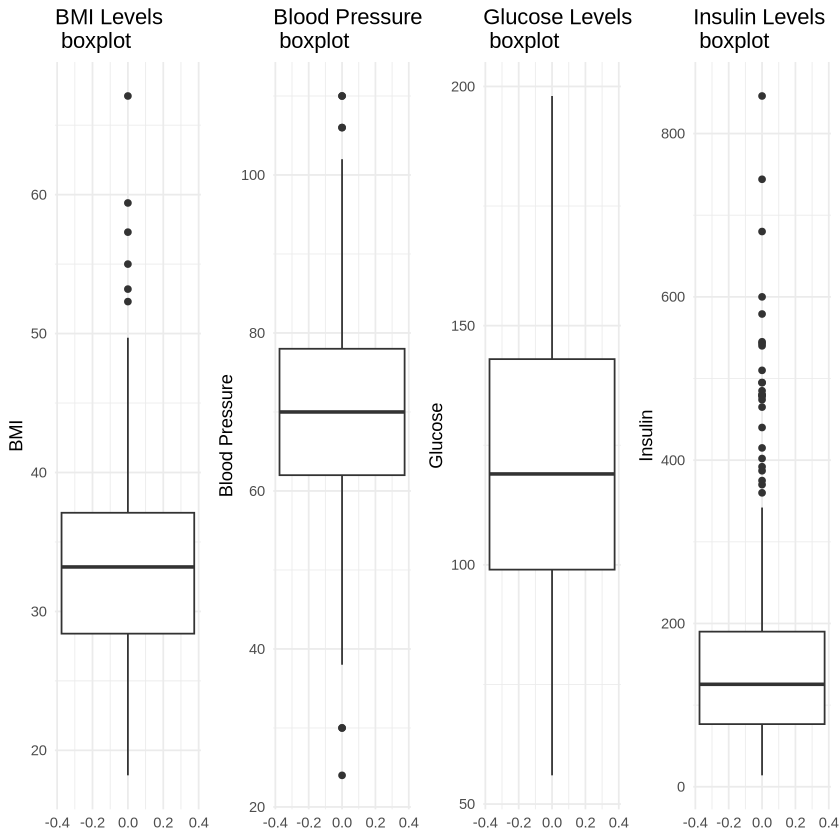

In [10]:
# visualise with boxplots to identify potential outliers
box_bmi <- ggplot(diabetes_cleaned, aes(y = BMI)) + geom_boxplot() + labs(title = "BMI Levels \n boxplot", y = "BMI") + theme_minimal()
box_bp <- ggplot(diabetes_cleaned, aes(y = BloodPressure)) + geom_boxplot() + labs(title = "Blood Pressure \n boxplot", y = "Blood Pressure") + theme_minimal()
box_glucose <- ggplot(diabetes_cleaned, aes(y = Glucose)) + geom_boxplot() + labs(title = "Glucose Levels \n boxplot", y = "Glucose") + theme_minimal()
box_insulin <- ggplot(diabetes_cleaned, aes(y = Insulin)) + geom_boxplot() + labs(title = "Insulin Levels \n boxplot", y = "Insulin") + theme_minimal()

grid.arrange(box_bmi, box_bp, box_glucose, box_insulin, ncol = 4)

- Dealing with outliers is an important part of cleaning, and it may be especially important since we're dealing with health data. We can either:
    1. remove outliers
    2. log-transform these variables to minimize their impact while retaining them, which could improve model stability
- I will be removing these outliers for relevant columns like Glucose, BloodPressure, Insulin, and BMI.

In [11]:
# calculate the IQR bounds for each column individually
Q1_bmi <- quantile(diabetes_cleaned$BMI, 0.25, na.rm = TRUE)
Q3_bmi <- quantile(diabetes_cleaned$BMI, 0.75, na.rm = TRUE)
IQR_bmi <- Q3_bmi - Q1_bmi

Q1_bp <- quantile(diabetes_cleaned$BloodPressure, 0.25, na.rm = TRUE)
Q3_bp <- quantile(diabetes_cleaned$BloodPressure, 0.75, na.rm = TRUE)
IQR_bp <- Q3_bp - Q1_bp

Q1_glucose <- quantile(diabetes_cleaned$Glucose, 0.25, na.rm = TRUE)
Q3_glucose <- quantile(diabetes_cleaned$Glucose, 0.75, na.rm = TRUE)
IQR_glucose <- Q3_glucose - Q1_glucose

Q1_insulin <- quantile(diabetes_cleaned$Insulin, 0.25, na.rm = TRUE)
Q3_insulin <- quantile(diabetes_cleaned$Insulin, 0.75, na.rm = TRUE)
IQR_insulin <- Q3_insulin - Q1_insulin

# filter rows based on the IQR bounds for each column
diabetes_clean <- diabetes_cleaned %>%
  filter(Glucose >= (Q1_glucose - 1.5 * IQR_glucose) & Glucose <= (Q3_glucose + 1.5 * IQR_glucose),
         BloodPressure >= (Q1_bp - 1.5 * IQR_bp) & BloodPressure <= (Q3_bp + 1.5 * IQR_bp),
         Insulin >= (Q1_insulin - 1.5 * IQR_insulin) & Insulin <= (Q3_insulin + 1.5 * IQR_insulin),
         BMI >= (Q1_bmi - 1.5 * IQR_bmi) & BMI <= (Q3_bmi + 1.5 * IQR_bmi))

In [12]:
nrow(diabetes)
nrow(diabetes_cleaned)
nrow(diabetes_clean)

[1] 768

[1] 392

[1] 357

Again, we can see that further cleaning by removing outliers has reduced the number of rows more, by 32 rows, but I believe this does not pose a significant issue.

***

**3. PROPOSED VISUALISATIONS**

Here, I have 5 proposed visualisations to explore the data, specifically the predictor variables.

**A. Correlation Matrix**

I believe starting with a **correlation matrix** to examine relationships among predictor variables, especially to detect multicollinearity, and creating a corrplot of the correlation matrix can visually reveal any strong correlations, helping to identify which predictors to use.
- Relevance: A correlation matrix helps explore the predictor variables' relationships with each other and identify variables that may be redundant or highly correlated, which can improve model interpretation and prevent issues in logistic regression.

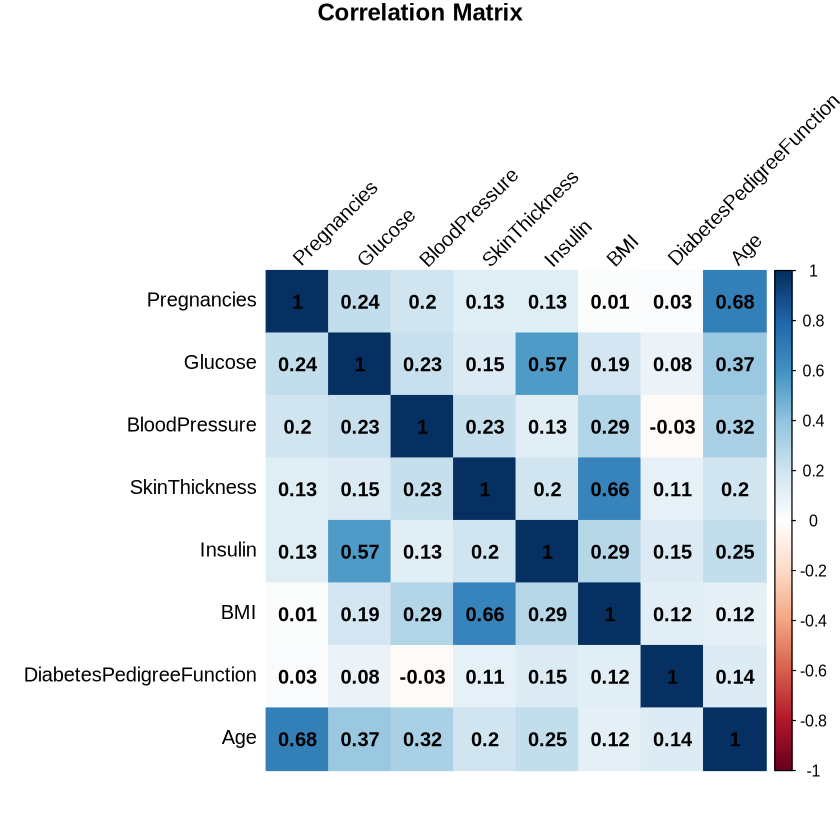

In [13]:
# correlation matrix
correlation_matrix <- diabetes_clean %>% select(- Outcome) %>% cor()
# corrplot of matrix
corrplot(correlation_matrix, method = "color", addCoef.col = "black",
         tl.col = "black", tl.srt = 45, title = "Correlation Matrix", mar = c(0,0,1,0))

- Most variables have **low correlations** (0.1-0.3) with each other. Relevant low correlations: _BMI and Glucose (0.19), Glucose and BP (0.23)_
    - Indicates that these variables have a weak relationship and limited predictive value for diabetes on their own, but they might still be relevant when considered alongside other variables.
- Relevant **moderate correlations** (0.3-0.5): _BMI and BP (0.29), BMI and Insulin (0.29)_
    - Indicates that there is a meaningful relationship between the two variables, which suggests they may have some predictive power in our model.
- Relevant **strong correlations** (0.5-0.7): _Insulin and Glucose (0.55)_
    - The relationships that are statistically significant and relevant to Outcome should be prioritized in our logistic regression model.

While there are many other relationships, with the strongest correlation being between Age and Pregnancies, I will only focus on the ones most relevant to our question of interest.

- Correlation  matrixes can also help with detecting multicollinearity, i.e. in strongly correlated predictor variables. Minimising multicollinearity is essential, especially in logistic regression, because high multicollinearity can distort the estimated coefficients and inflate standard errors, making it difficult to assess the individual effect of each predictor. Therefore, by addressing multicollinearity, we can improve the overall performance and reliability of our model, leading to more accurate predictions when assessing diabetes risk.
- We can check the Variance Inflation Factor to assess multicollinearity:
    - Low VIF (< 5) indicates no significant multicollinearity.
    - Moderate VIF (5 - 10) suggests some multicollinearity and that further investigation may be done.
    - High VIF (> 10) indicates serious multicollinearity and that we should consider removing or combining predictors.

In [14]:
model <- glm(Outcome ~ ., data = diabetes_clean, family = binomial)
print(vif(model))

             Pregnancies                  Glucose            BloodPressure 
                1.917159                 1.315043                 1.197089 
           SkinThickness                  Insulin                      BMI 
                1.702512                 1.263893                 1.883575 
DiabetesPedigreeFunction                      Age 
                1.087248                 2.055969 


- Similarly to what we inferred from the correlation matrix, the variables tend to have low correlations with each other.
- We can see that the VIF values from our cleaned dataset indicate that all values are below the typical threshold of concern (around 5 or 10), suggesting no significant multicollinearity.
    - Age has the highest VIF value at 2.05, which is still considered low, but it may be worth noting that it’s slightly more correlated with other predictors compared to the others.

**B. Pair Plot**


A **Pair Plot** can provide a summary visualisation before delving deeper into the variables by visualising pairwise relationships among several continuous variables in a dataset. For the diabetes dataset, the pair plot can reveal how different health metrics relate to each other and to the Outcome variable.

- By examining the scatterplots of one variable against another, we can identify linear or non-linear relationships among predictors.
    - E.g. between Insulin and Glucose may suggest a potential association between insulin and blood sugar levels, which may be relevant to understanding diabetes risk.
- Diagonally, the density plots show the distribution of each variable, which helps to quickly assess each variable’s spread, skewness, and potential outliers.
    - E.g. if Glucose is left-skewed, most of the glucose readings are on the higher end, with few extreme low values that pull the mean down.
- By colouring the points according to the Outcome variable, we can observe patterns between diabetes-positive and diabetes-negative individuals, which makes it easy to spot any separation between the groups based on the predictor values. 
    - E.g. if individuals with diabetes (Outcome = 1) generally have higher Glucose and BMI values than those without diabetes, it suggests these variables are informative predictors for the logistic regression model, and that this difference can be explored further.

Relevance: The pair plot effectively reveals the relationships between predictors and identifies potential issues before proceeding to modelling. In logistic regression, knowing which variables are strongly related to each other or to the outcome can inform decisions on variable selection and model refinement, ultimately helping to create a more accurate and interpretable model.

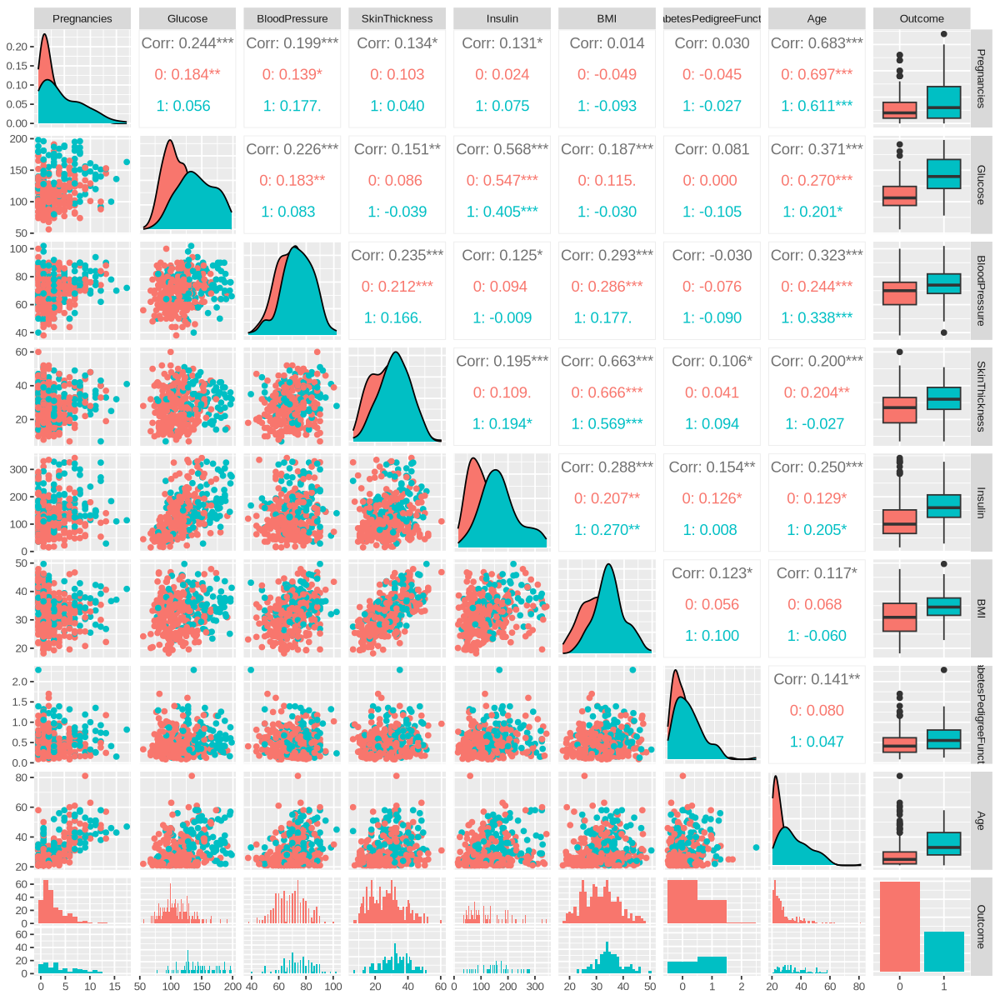

In [15]:
options(repr.plot.width = 10, repr.plot.height = 10)
diabetes_clean %>% 
    ggpairs(progress = FALSE, aes(colour = Outcome), lower = list(combo = wrap("facethist", binwidth = 1))) +
    theme(text = element_text(size = 10), plot.title = element_text(face = "bold"), axis.title = element_text(face = "bold")) + labs(colour = "Diabetes Outcome")

**C. Histograms for each continuous predictor variable**

We can create **histograms** to understand their distributions. I will be focusing on four main continuous predictors for now that may be most relevant to our question of interest, as mentioned earlier - BMI, BloodPressure, Glucose, and Insulin.

Relevance: This will provide insights into the central tendency, spread, and skewness of each variable, which can help detect anomalies, as well as reveal possible patterns for each predictor variable. It can also show if there is a cause of concern for data transformation to improve model accuracy (i.e. highly skewed predictors) after data cleaning.

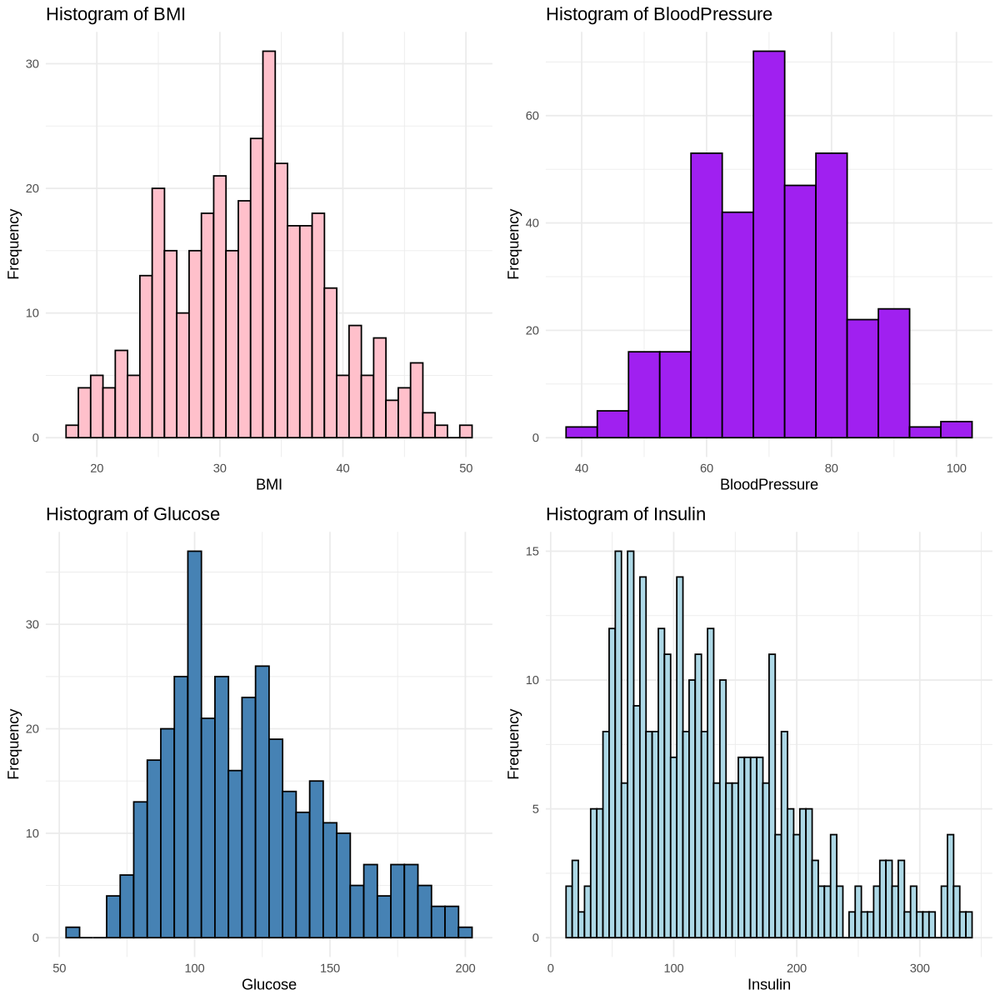

In [16]:
hist_bmi <- ggplot(diabetes_clean, aes(x = BMI)) + geom_histogram(binwidth = 1, fill = "pink", color = "black") +
  labs(title = "Histogram of BMI", x = "BMI", y = "Frequency") + theme_minimal()

hist_bp <- ggplot(diabetes_clean, aes(x = BloodPressure)) + geom_histogram(binwidth = 5, fill = "purple", color = "black") +
  labs(title = "Histogram of BloodPressure", x = "BloodPressure", y = "Frequency") + theme_minimal()

hist_glucose <- ggplot(diabetes_clean, aes(x = Glucose)) + geom_histogram(binwidth = 5, fill = "steelblue", color = "black") +
  labs(title = "Histogram of Glucose", x = "Glucose", y = "Frequency") + theme_minimal()

hist_insulin <- ggplot(diabetes_clean, aes(x = Insulin)) + geom_histogram(binwidth = 5, fill = "lightblue", color = "black") +
  labs(title = "Histogram of Insulin", x = "Insulin", y = "Frequency") + theme_minimal()

grid.arrange(hist_bmi, hist_bp, hist_glucose, hist_insulin, ncol = 2)

- We can now see the distribution of these four variables in detail.
- They all follow an almost normal distribution, given slight right-skewness for Glucose and Insulin.
- However, there doesn't seem to be severe skewness or outliers, which is a good sign about the data cleaning performed earlier.

**D. Density plots split by Outcome groups**

- **Density plots** split by Outcome group can show the distribution of each relevant predictor variable for people with and without diabetes, showing how distributions vary between the groups.
- Separate Density distributions for each Outcome group visually differentiate the distribution of each metric for individuals with and without diabetes. For instance, observing higher values for those with diabetes, showing a right-shift in the distribution, may confirm that the health metric could be a strong predictor.
- Therefore, this helps justify the use of these variables in our model, as they display clear group separations, and also suggests that the model should account for non-normal distributions in these predictors, possibly using logistic regression with log-transformed variables to handle skewness.

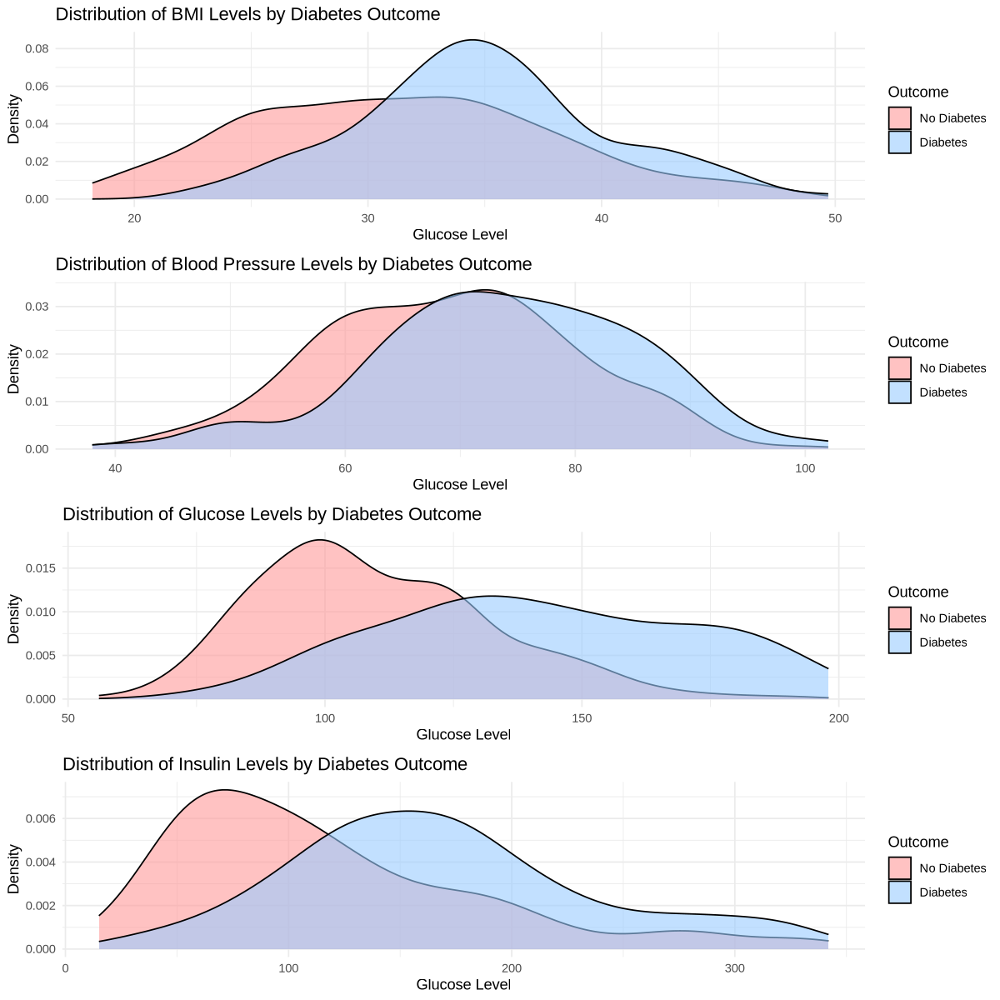

In [17]:
density_bmio <- ggplot(diabetes_clean, aes(x = BMI, fill = factor(Outcome))) + geom_density(alpha = 0.6) + theme_minimal() +
    scale_fill_manual(values = c("#FF9999", "#99CCFF"), labels = c("No Diabetes", "Diabetes")) +
    labs(title = "Distribution of BMI Levels by Diabetes Outcome", x = "Glucose Level", y = "Density", fill = "Outcome")

density_bpo <- ggplot(diabetes_clean, aes(x = BloodPressure, fill = factor(Outcome))) + geom_density(alpha = 0.6) + theme_minimal() +
    scale_fill_manual(values = c("#FF9999", "#99CCFF"), labels = c("No Diabetes", "Diabetes")) +
    labs(title = "Distribution of Blood Pressure Levels by Diabetes Outcome", x = "Glucose Level", y = "Density", fill = "Outcome")

density_go <- ggplot(diabetes_clean, aes(x = Glucose, fill = factor(Outcome))) + geom_density(alpha = 0.6) + theme_minimal() +
    scale_fill_manual(values = c("#FF9999", "#99CCFF"), labels = c("No Diabetes", "Diabetes")) +
    labs(title = "Distribution of Glucose Levels by Diabetes Outcome", x = "Glucose Level", y = "Density", fill = "Outcome")

density_io <- ggplot(diabetes_clean, aes(x = Insulin, fill = factor(Outcome))) + geom_density(alpha = 0.6) + theme_minimal() +
    scale_fill_manual(values = c("#FF9999", "#99CCFF"), labels = c("No Diabetes", "Diabetes")) +
    labs(title = "Distribution of Insulin Levels by Diabetes Outcome", x = "Glucose Level", y = "Density", fill = "Outcome") 

grid.arrange(density_bmio, density_bpo, density_go, density_io, ncol = 1)

- Diabetes-positive patients generally have higher **glucose** levels compared to diabetes-negative patients; the distribution peaks at around 130 for diabetes-positive and 100 for diabetes-negative, suggesting that higher glucose levels are associated with diabetes.
- The distribution of **blood pressure** levels also differs between Outcome, albeit less than glucose; diabetic patients tend to have slightly higher blood pressure levels on average, but there is considerable overlap between the two groups. 
- The **insulin** levels are noticeably higher for diabetic than non-diabetic patients, although both distributions show a wide range of values, which could indicate that insulin levels alone may not be a strong distinguishing factor without additional context.
- Diabetic patients generally have higher **BMI** values compared to non-diabetic patients, peaking at 35 vs 30, suggesting that higher BMI is associated with an increased risk of diabetes, although there is still significant overlap.

Overall, we can infer that Glucose and BMI may be strong indicators of diabetes, and Blood Pressure and Insulin show less distinct separation between the two groups, although diabetic patients tend to have slightly higher values for both. With more understanding of variable relationships, we can expect how each predictor might contribute to the logistic regression model and help make informed decisions during model building, interpretation, and fine-tuning.

**E. Boxplots by Outcome group**

Lastly, **Boxplots by Outcome Group** can similarly visualise the difference in the health metric between diabetes positive and negative patients, but also illustrate the spread and central tendency of predictor variables within each outcome category, making it easy to spot any significant differences in predictors.

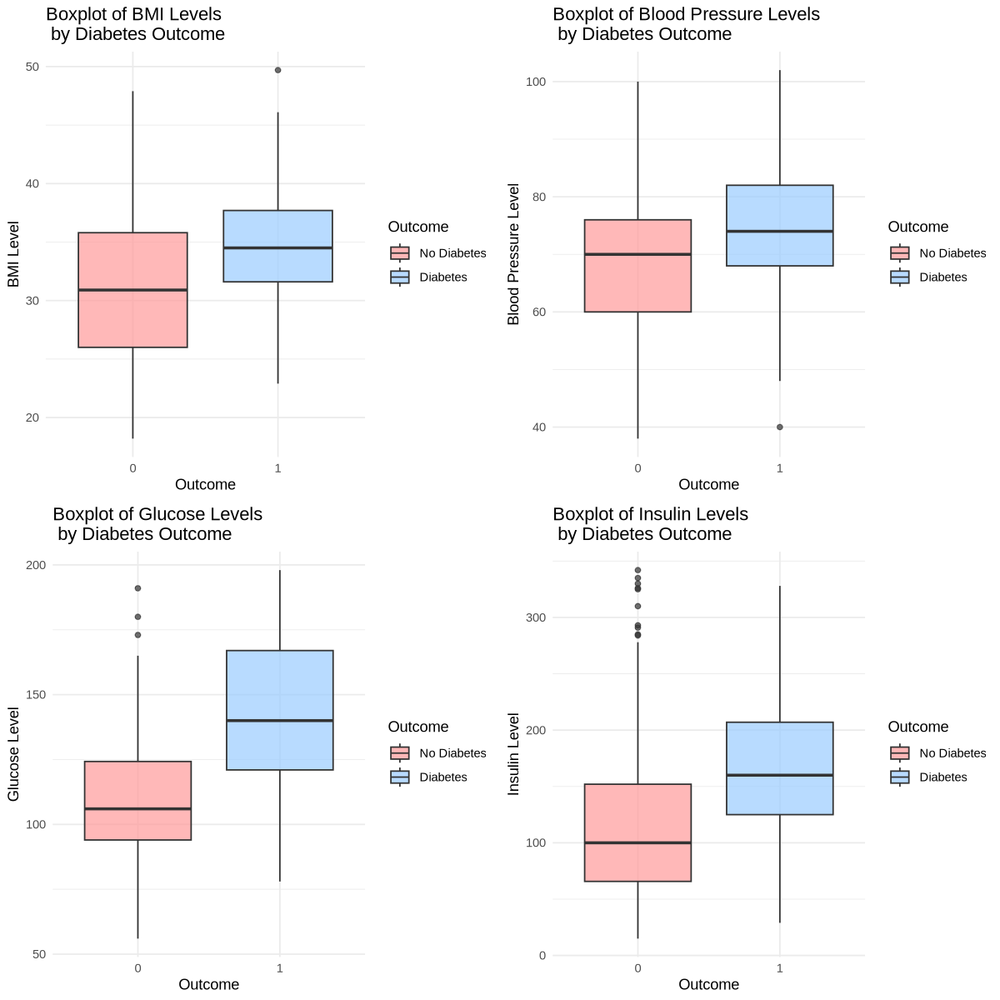

In [18]:
box_bmio <- ggplot(diabetes_clean, aes(x = factor(Outcome), y = BMI, fill = factor(Outcome))) + geom_boxplot(alpha = 0.7) +
    scale_fill_manual(values = c("#FF9999", "#99CCFF"), labels = c("No Diabetes", "Diabetes")) + theme_minimal() +
    labs(title = "Boxplot of BMI Levels \n by Diabetes Outcome", x = "Outcome", y = "BMI Level", fill = "Outcome")

box_bpo <- ggplot(diabetes_clean, aes(x = factor(Outcome), y = BloodPressure, fill = factor(Outcome))) + geom_boxplot(alpha = 0.7) +
    scale_fill_manual(values = c("#FF9999", "#99CCFF"), labels = c("No Diabetes", "Diabetes")) + theme_minimal() +
    labs(title = "Boxplot of Blood Pressure Levels \n by Diabetes Outcome", x = "Outcome", y = "Blood Pressure Level", fill = "Outcome")

box_go <- ggplot(diabetes_clean, aes(x = factor(Outcome), y = Glucose, fill = factor(Outcome))) + geom_boxplot(alpha = 0.7) +
    scale_fill_manual(values = c("#FF9999", "#99CCFF"), labels = c("No Diabetes", "Diabetes")) + theme_minimal() +
    labs(title = "Boxplot of Glucose Levels \n by Diabetes Outcome", x = "Outcome", y = "Glucose Level", fill = "Outcome")

box_io <- ggplot(diabetes_clean, aes(x = factor(Outcome), y = Insulin, fill = factor(Outcome))) + geom_boxplot(alpha = 0.7) +
    scale_fill_manual(values = c("#FF9999", "#99CCFF"), labels = c("No Diabetes", "Diabetes")) + theme_minimal() +
    labs(title = "Boxplot of Insulin Levels \n by Diabetes Outcome", x = "Outcome", y = "Insulin Level", fill = "Outcome")

grid.arrange(box_bmio, box_bpo, box_go, box_io, ncol = 2)

From these box plots, we can infer:
- All mean levels are higher in diabetes-positive compared to diabetes-negative patients.
- **Glucose** has the most distinct difference between groups, with higher means, quartiles, minimum, and maximum, as well as a wider IQR for diabetic patients, suggesting Glucose could be a strong predictor in the logistic regression model, though there is more variability. There are few high outliers for mnon-diabetics, though generally, the levels are lower for diabetes-negative patients.
- **BMI** has higher mean and quartiles for diabetic patients, but the IQR is wider for non-diabetic patients, indicating more variability. Diabetic patients show a few high outliers, indicating that some have particularly high BMI levels.
- While the mean and quartiles of **blood pressure** for diabetes-positive patients is higher, there are similar distribution characteristics between groups with some overlap, so it might be a weaker predictor, as blood pressure doesn’t differentiate much between diabetic and non-diabetic groups.
- **Insulin** levels mean and quartile values are higher for diabetic patients, with similar IQR. However, there are several outliers on the higher end for non-diabetic patients, so the influence may be considered.

Therefore, comparing these statistics provides a sense of the variables that could significantly differentiate diabetic from non-diabetic outcomes, which also can help for informed variable selection and transformation for the logistic regression model.

***
***

### Conclusion

Therefore, this EDA approach cleans the data, prepares the data for logistic regression, and checks for any potential issues, like multicollinearity or outliers, that could impact our model’s accuracy. So, by combining data cleaning with targeted visualisations, setting up a solid foundation for the modelling phase.

**Transition to Model Building for assignment 2**
- After model creation, for each relevant continuous predictor variable, we could create a separate scatter plot with a fitted logistic regression curve to visualize how it correlates with the likelihood of diabetes.
    - This allows us to see how the likelihood of diabetes changes as the predictor variable values increase.
    - This type of plot can visually demonstrate the probability increase in Outcome based on individual predictor variables.

_Code: reference to class worksheets & tutorials, and online research for code here which has not been covered in class_

***
***
***

### Part 2 - Implementation of a proposed model:

### 1. Methods and Plan

##### Propose one method to address your question of interest using the selected dataset and explain why it was chosen. You do not need to run the model and present results at this stage. Just a high-level thinking of what model you are planning to use. 

##### In your explanation, respond to the following questions:
- ##### Why is this method appropriate?
- ##### Which assumptions are required, if any, to apply the method selected?
- ##### What are the potential limitations or weaknesses of the method selected?

##### As mentioned before, it is fine to share ideas with other group members. However, you don’t need to agree on a unique common method for the group project. In fact, usually the analysis comprise different methods with different strengths and limitations! Regardless of how many methods are proposed within each group, each team member needs to propose one method and justify its choice.

**Why is this method appropriate?**
- Our goal is to develop a model that predicts the likelihood of diabetes based on various health metrics.
- Given the binary dependent variable Outcome, logistic regression is appropriate, as it models the probability of an event occuring when the dependent variable is binary and identifies the predictors with most influence through coefficient analysis.

**Which assumptions are required, if any, to apply the method selected?**
- Binary dependent variable
- Independent observations
- Linearity between predictors and log-odds of dependent variable
- Large sample size
- Little to no multicollinearity

**What are the potential limitations or weaknesses of the method selected?**
- Overfitting with too many predictors relative to the sample size or if irrelevant variables are included
- Outliers might reduce model performance due to biased coefficient estimates
- Unstable coefficients due to multicollinearity
- Poor performance if predictor relationships with log-odds are non-linear.

### 2. Computational Code and Output

##### Write a computation code to implement the method proposed in the previous assignment (or suggested in the interview) and use *only one* visualization or table to report the results. In 3 or 4 sentences give a brief interpretation of the results. If needed, comment on any unexpected result or potential problems with the analysis, and possible ways to address issues encountered. If results are as expected, explain how they address the question of interest.

**The model**

In [19]:
# full model
full_model <- glm(Outcome ~., data = diabetes_clean, family = binomial)
full_model


Call:  glm(formula = Outcome ~ ., family = binomial, data = diabetes_clean)

Coefficients:
             (Intercept)               Pregnancies                   Glucose  
              -1.085e+01                 1.171e-01                 4.011e-02  
           BloodPressure             SkinThickness                   Insulin  
               6.964e-03                 6.997e-03                 3.874e-04  
                     BMI  DiabetesPedigreeFunction                       Age  
               7.574e-02                 1.682e+00                 1.336e-02  

Degrees of Freedom: 356 Total (i.e. Null);  348 Residual
Null Deviance:	    439.3 
Residual Deviance: 299.9 	AIC: 317.9

We can use **stepwise selection methods** when we don’t know which variables are most relevant for the model, provides accurate predictions, and uses fewer predictors.

One is **Forward Selection**, which starts with an empty model and adds variables sequentially based on their statistical significance or improvement in a selection criterion (e.g. AIC), then stops when no significant improvement is observed.

In [20]:
fwd_sel <- regsubsets(Outcome ~., data = diabetes_clean, method = "forward", nvmax = 8)
summary_fwd <- summary(fwd_sel)
summary_fwd

Subset selection object
Call: regsubsets.formula(Outcome ~ ., data = diabetes_clean, method = "forward", 
    nvmax = 8)
8 Variables  (and intercept)
                         Forced in Forced out
Pregnancies                  FALSE      FALSE
Glucose                      FALSE      FALSE
BloodPressure                FALSE      FALSE
SkinThickness                FALSE      FALSE
Insulin                      FALSE      FALSE
BMI                          FALSE      FALSE
DiabetesPedigreeFunction     FALSE      FALSE
Age                          FALSE      FALSE
1 subsets of each size up to 8
Selection Algorithm: forward
         Pregnancies Glucose BloodPressure SkinThickness Insulin BMI
1  ( 1 ) " "         "*"     " "           " "           " "     " "
2  ( 1 ) " "         "*"     " "           " "           " "     " "
3  ( 1 ) "*"         "*"     " "           " "           " "     " "
4  ( 1 ) "*"         "*"     " "           " "           " "     "*"
5  ( 1 ) "*"         "*"     " 

In [21]:
# extract the logical row for the model with the minimum Cp
selected_preds_fwd <- summary_fwd$which[which.min(summary_fwd$cp), ]

# filter out the intercept, keep only true values (selected predictors)
selected_preds_fwd <- names(selected_preds_fwd[selected_preds_fwd == TRUE])

# remove Intercept from the list of selected predictors
selected_preds_fwd <- selected_preds_fwd[selected_preds_fwd != "(Intercept)"]
selected_preds_fwd

[1] "Pregnancies"              "Glucose"                 
[3] "BMI"                      "DiabetesPedigreeFunction"

According to Forward Selection, we include Pregnancies, Glucose, BMI, and DiabetesPedigreeFunction.

In [22]:
# forward selection model
fwd_model <- glm(Outcome ~ Pregnancies + Glucose + BMI + DiabetesPedigreeFunction, data = diabetes_clean, family = binomial)
fwd_model


Call:  glm(formula = Outcome ~ Pregnancies + Glucose + BMI + DiabetesPedigreeFunction, 
    family = binomial, data = diabetes_clean)

Coefficients:
             (Intercept)               Pregnancies                   Glucose  
               -10.46668                   0.15158                   0.04177  
                     BMI  DiabetesPedigreeFunction  
                 0.08902                   1.74219  

Degrees of Freedom: 356 Total (i.e. Null);  352 Residual
Null Deviance:	    439.3 
Residual Deviance: 301 	AIC: 311

Another method is **Backward Selection**, which starts with a full model and iteratively removes the least significant variable one by one based on their lack of significance or contribution, stopping when all remaining predictors contribute significantly.

In [23]:
bwd_sel <- regsubsets(Outcome ~ ., data = diabetes_clean, method = "backward", nvmax = 8)
summary_bwd <- summary(bwd_sel)
summary_bwd

Subset selection object
Call: regsubsets.formula(Outcome ~ ., data = diabetes_clean, method = "backward", 
    nvmax = 8)
8 Variables  (and intercept)
                         Forced in Forced out
Pregnancies                  FALSE      FALSE
Glucose                      FALSE      FALSE
BloodPressure                FALSE      FALSE
SkinThickness                FALSE      FALSE
Insulin                      FALSE      FALSE
BMI                          FALSE      FALSE
DiabetesPedigreeFunction     FALSE      FALSE
Age                          FALSE      FALSE
1 subsets of each size up to 8
Selection Algorithm: backward
         Pregnancies Glucose BloodPressure SkinThickness Insulin BMI
1  ( 1 ) " "         "*"     " "           " "           " "     " "
2  ( 1 ) " "         "*"     " "           " "           " "     " "
3  ( 1 ) "*"         "*"     " "           " "           " "     " "
4  ( 1 ) "*"         "*"     " "           " "           " "     "*"
5  ( 1 ) "*"         "*"     

In [24]:
# extract the logical row for the model with the minimum Cp
selected_preds_bwd <- summary_bwd$which[which.min(summary_bwd$cp), ]

# filter out the intercept, keep only true values (selected predictors)
selected_preds_bwd <- names(selected_preds_bwd[selected_preds_bwd == TRUE])

# remove Intercept from the list of selected predictors
selected_preds_bwd <- selected_preds_bwd[selected_preds_bwd != "(Intercept)"]
selected_preds_bwd

[1] "Pregnancies"              "Glucose"                 
[3] "BMI"                      "DiabetesPedigreeFunction"

In [28]:
# backward selection model
bwd_model <- glm(Outcome ~ Pregnancies + Glucose + BMI + DiabetesPedigreeFunction, data = diabetes_clean, family = binomial)
bwd_model


Call:  glm(formula = Outcome ~ Pregnancies + Glucose + BMI + DiabetesPedigreeFunction, 
    family = binomial, data = diabetes_clean)

Coefficients:
             (Intercept)               Pregnancies                   Glucose  
               -10.46668                   0.15158                   0.04177  
                     BMI  DiabetesPedigreeFunction  
                 0.08902                   1.74219  

Degrees of Freedom: 356 Total (i.e. Null);  352 Residual
Null Deviance:	    439.3 
Residual Deviance: 301 	AIC: 311

>

**AIC** and **BIC** compare model fit while accounting for model complexity (number of parameters). Lower values indicate better predictive power.

In [26]:
AIC(full_model, fwd_model, bwd_model)
BIC(full_model, fwd_model, bwd_model)

,df,AIC
,<dbl>,<dbl>
full_model,9,317.8715
fwd_model,5,311.0216
bwd_model,5,311.0216


,df,BIC
,<dbl>,<dbl>
full_model,9,352.7711
fwd_model,5,330.4103
bwd_model,5,330.4103


All models have similar AICs and BICs, but the reduced models have lower values, suggesting they have better predictive performance than a full model without sacrificing predictive accuracy.

Also, AIC and BIC for forward and backward selection are the same, indicating equal predictive performance and that reducing predictors improves model efficiency without sacrificing performance.

**The visualisation**

A **ROC** curve represents model performance across all thresholds.
- A curve closer to the top-left corner (higher sensitivity and lower false positive rates) indicates better predictive ability

The **AUC** quantifies the ROC curve’s overall performance, reflecting the model’s classification capability. 
- AUC can be between 0 (completely random) and 1 (perfect prediction)

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases



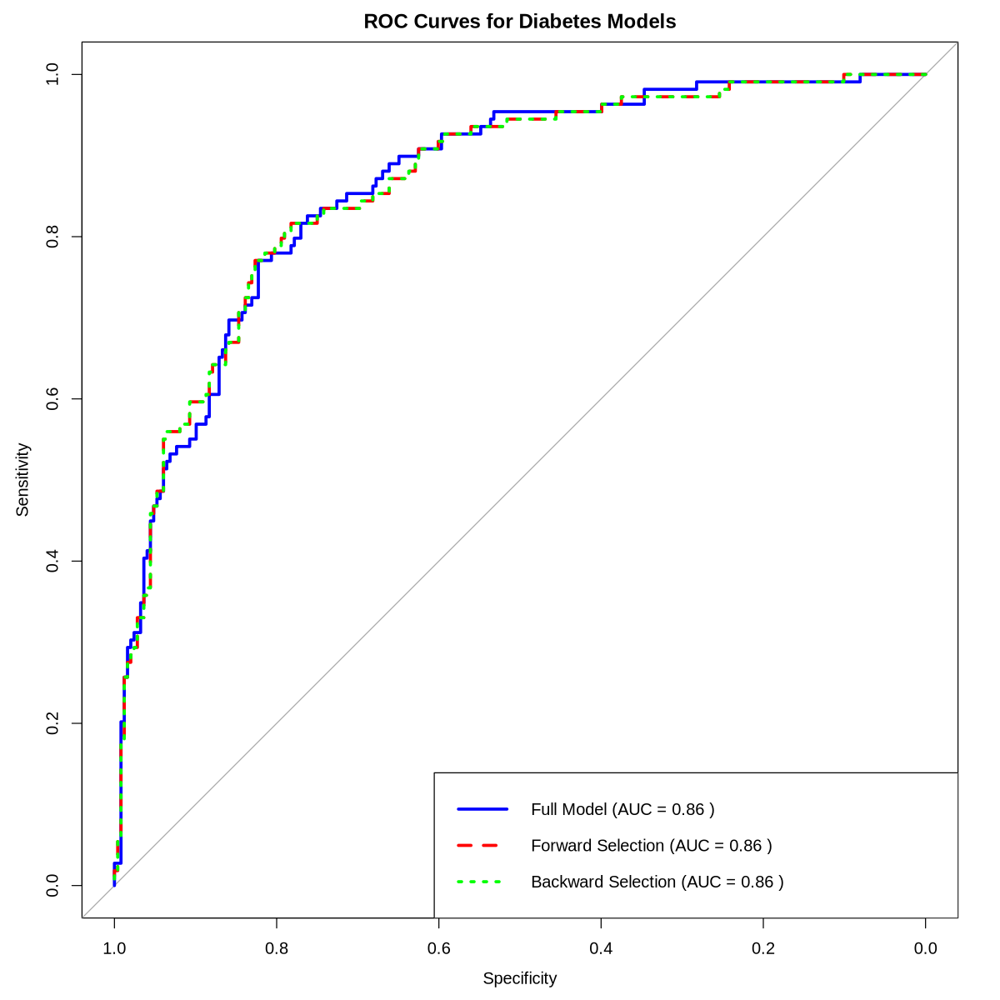

In [27]:
# full model ROC curve
ROC_full <- roc(response = diabetes_clean$Outcome,
                predictor = predict(full_model, type = "response"))

# forward selection model ROC curve
ROC_fwd <- roc(response = diabetes_clean$Outcome,
               predictor = predict(fwd_model, type = "response"))

# backward selection model ROC curve
ROC_bwd <- roc(response = diabetes_clean$Outcome,
               predictor = predict(bwd_model, type = "response"))

# plot all ROC curves
plot(ROC_full, print.auc = FALSE, col = "blue", lwd = 3, lty = 1, 
     main = "ROC Curves for Diabetes Models")
plot(ROC_fwd, print.auc = FALSE, col = "red", lwd = 3, lty = 2, add = TRUE)
plot(ROC_bwd, print.auc = FALSE, col = "green", lwd = 3, lty = 3, add = TRUE)

# add legend with AUC values
legend("bottomright", legend = c(paste("Full Model (AUC =", round(ROC_full$auc, 2), ")"),
                  paste("Forward Selection (AUC =", round(ROC_fwd$auc, 2), ")"),
                  paste("Backward Selection (AUC =", round(ROC_bwd$auc, 2), ")")),
       col = c("blue", "red", "green"), lwd = 3, lty = c(1, 2, 3))

Despite slight differences in AIC/BIC values, the models have overlapping ROC curves and an identical AUC of 0.86, suggesting all three models have an 86% chance of correctly distinguishing between positive and negative cases, demonstrating excellent ability to distinguish between diabetic and non-diabetic cases. 

The identical AUC indicates that all models perform equally well, but the slightly lower AIC/BIC for the reduced models justify selecting them, as they achieve the same AUC with fewer predictors, and are simpler and more interpretable.

While performance is well, potential issues include multicollinearity, overfitting, and imbalanced classes, which could impact model performance or interpretation. These can be addressed by removing correlated predictors, regularization techniques such as Lasso or Ridge, and balancing the dataset, respectively.

***

Word count: 500*

_*Word count excludes the title, questions, code, & output_

*Code: reference to class worksheets & tutorials, and online sources for additional help.*